## Домашня работа 5.
## Обучение без учителя.

Дедлайн 9 декабря в 21:00.



Максимальная оценка - 10 баллов + 1 бонусный балл.

Это супер-творческая домашка — рисутей картинки, пытайтесь их понять и интерпретировать, пробуйте разные методы 👒

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns

%matplotlib inline

plt.style.use('ggplot')

Задание основано на соревновании [Leaf Classification](https://www.kaggle.com/c/leaf-classification/).

Дана информация о 990 листьях, каждый из которых был сорван с одного из 99 видов растений.</br> 
Необходимо построить модель, которая могла бы определить, к какому растению относится каждый лист.

Большую часть задания вы будете работать с черно-белыми изображениями листьев, а в конце поработаете также с готовыми признаковыми описаниями листьев.

### Загрузка данных

Скачайте данные по ссылкам: [таблица](https://drive.google.com/file/d/1LBc2YeddvEvDaCQHktJPZgJ3tZhJSGHh/view?usp=sharing) и [архив](https://drive.google.com/file/d/1cY5v5T26-_nqLkrJ6yUIVPIhCp7tulSi/view?usp=sharing) с изображениями.

Загрузим таблицу `table_data.csv`.

В ней вы найдете
* id - идентификатор листика
* species - столбец с названием растения (класс)
* margin, shape, texture - некоторые признаки листьев

In [2]:
#DATA_DIR = os.path.join(DATA_DIR)
#IMG_DIR = os.path.join(DATA_DIR, 'images')
#filepath = os.path.join(DATA_DIR, 'table_data.csv')

In [3]:
table_data = pd.read_csv('table_data.csv')

In [4]:
print("Число классов: %d"%table_data.species.nunique())

Число классов: 99


In [5]:
table_data

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


### Создание контрольного и обучающих множеств (1 балл)

* Задайте `random_seed`, который необходимо будет использовать при **всех** случаях использования генератора случайных чисел
* С помощью LabelEncoder закодируйте столбец `species` из исходных данных - вы должны получить одномерный numpy массив с метками классов от 0 до 98
* В переменную `X` запишите значения признаков margin, shape, texture - вы должны получить numpy-матрицу
* Случайным образом разбейте данные на обучающую и контрольную выборку, причем так, чтобы в контрольной выборке содержалось по 2 объекта каждого класса.
* Сохраните индексы объектов обучающего и контрольного множеств в переменные train_idx и test_idx

#### Hint
[Это](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedShuffleSplit.html#sklearn.model_selection.StratifiedShuffleSplit) может помочь, чтобы сгенерировать выборку с нужными пропорциями классов.

In [6]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedShuffleSplit

In [7]:
np.random.seed(6)

labels = LabelEncoder().fit_transform(table_data.species) 
X = table_data.drop(['species'], axis = 1).values
classes = table_data.species.unique() #обман чтобы набрать классы
X.shape

(990, 193)

In [8]:
sss = StratifiedShuffleSplit(test_size=0.2, random_state=6)  # чтобы в тестовой выборке по 2 объекта каждого класса, надо чтобы test_size = 0,2 от 10 экземпляров

sss.split(X, labels)

for train_idx, test_idx in sss.split(X, labels):
     X_train, X_test = X[train_idx], X[test_idx]
     y_train, y_test = labels[train_idx], labels[test_idx]
     TRAIN_ID = X_train[:, 0]
     TEST_ID = X_test[:, 0]

In [9]:
#сейчас посмотрим на наибольший id, который получился в тест и трейн; если одно из чисел 1584 - мы молодцы
print(TRAIN_ID.max(), TEST_ID.max())

1584.0 1578.0


In [10]:
#проверочка, посмотрим сколько элементов каждого класса вошло в y_test - по два, как и ожидалось
unique, counts = np.unique(y_test, return_counts=True)
dict(zip(unique, counts))

{0: 2,
 1: 2,
 2: 2,
 3: 2,
 4: 2,
 5: 2,
 6: 2,
 7: 2,
 8: 2,
 9: 2,
 10: 2,
 11: 2,
 12: 2,
 13: 2,
 14: 2,
 15: 2,
 16: 2,
 17: 2,
 18: 2,
 19: 2,
 20: 2,
 21: 2,
 22: 2,
 23: 2,
 24: 2,
 25: 2,
 26: 2,
 27: 2,
 28: 2,
 29: 2,
 30: 2,
 31: 2,
 32: 2,
 33: 2,
 34: 2,
 35: 2,
 36: 2,
 37: 2,
 38: 2,
 39: 2,
 40: 2,
 41: 2,
 42: 2,
 43: 2,
 44: 2,
 45: 2,
 46: 2,
 47: 2,
 48: 2,
 49: 2,
 50: 2,
 51: 2,
 52: 2,
 53: 2,
 54: 2,
 55: 2,
 56: 2,
 57: 2,
 58: 2,
 59: 2,
 60: 2,
 61: 2,
 62: 2,
 63: 2,
 64: 2,
 65: 2,
 66: 2,
 67: 2,
 68: 2,
 69: 2,
 70: 2,
 71: 2,
 72: 2,
 73: 2,
 74: 2,
 75: 2,
 76: 2,
 77: 2,
 78: 2,
 79: 2,
 80: 2,
 81: 2,
 82: 2,
 83: 2,
 84: 2,
 85: 2,
 86: 2,
 87: 2,
 88: 2,
 89: 2,
 90: 2,
 91: 2,
 92: 2,
 93: 2,
 94: 2,
 95: 2,
 96: 2,
 97: 2,
 98: 2}

Теперь загрузим картинки. В папке `images` лежат 1584 изображения в градациях серого различного размера.

In [11]:
# попробуем загрузить 1 изображение
IMG_DIR = 'images'
filepath = os.path.join(IMG_DIR, '33.jpg')
img = plt.imread(filepath)

(357, 700)


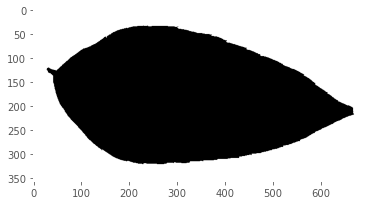

In [12]:
print(img.shape)
plt.imshow(img, cmap='Greys')
plt.grid(None)

Все изображения имеют разный размер, будем приводить их к размеру 100x100 с помощью функции skimage.transform.resize:

In [13]:
from skimage.transform import resize

In [14]:
img_resized = resize(img, (100, 100))

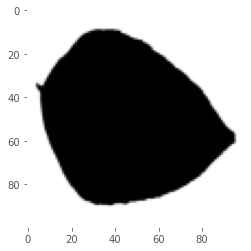

In [15]:
plt.imshow(img_resized, cmap='Greys')
plt.grid(None)

### Загрузка изображений (1 балл)
Загрузите все изображения листьев, отмасштабируйте, вытяните в вектор длины 10000 (np.ravel) и запишите их в массив размера (число изображений) x 10000. Сделайте два массива - с обучающими и контрольными картинками (останутся только не картинки, которые встречались в табличных данных), назовите их imgs_train и imgs_test. Столбец id в таблице соответствует номерам картинок в названиях файлов.  В итоге мы превратим картинки в попиксельные признаковые описания объектов-листьев.

In [16]:
IMG_DIR = 'images'
all_pictures = np.empty((1584,10000))
for i in range(1, 1584):
    filepath = os.path.join(IMG_DIR, f'{i}.jpg')
    img = plt.imread(filepath)
    img_resized = np.ravel(resize(img, (100, 100)))
    all_pictures[i-1] = img_resized

In [17]:
img_train = all_pictures[list(TRAIN_ID.astype(int) - 1)]
img_test = all_pictures[list(TEST_ID.astype(int) - 1)]
img_test.shape  # должна быть 198 (длина тестовой выборки) на 10000

(198, 10000)

### Простая визуализация (1 балл за код + 1 балл за выводы)
* Нарисуйте в табличке 10x10 99 изображений листьев - по одному каждого класса (одна ячейка таблицы останется пустой)
* Нарисуйте в табличке 10x10 100 гистограмм значений случайно выбранных пикселей (берем значние пикселя на всех картинках и составляем из них вектор, используйте векторизацию)
* Нарисуйте 1 картинку - "средний лист". Просто усредните все пиксели по изображениям. Затем нарисуйте еще 1 картинку - разброс каждого пикселя (насколько он отклоняется от среднего). Для этого воспользуйтесь функцией np.std

Все пункты выполняйте с использованием обучающей выборки (у нас данные однородны).

In [18]:
sss2 = StratifiedShuffleSplit(1, test_size=0.1, random_state=6)
sss2.split(X, labels)
for train_idx, test_idx in sss2.split(X, labels):
    X_test2 = X[test_idx]
    TEST_ID2 = X_test2[:, 0]
img_test2 = all_pictures[list(TEST_ID2.astype(int) - 1)]
img_test2.shape

(99, 10000)

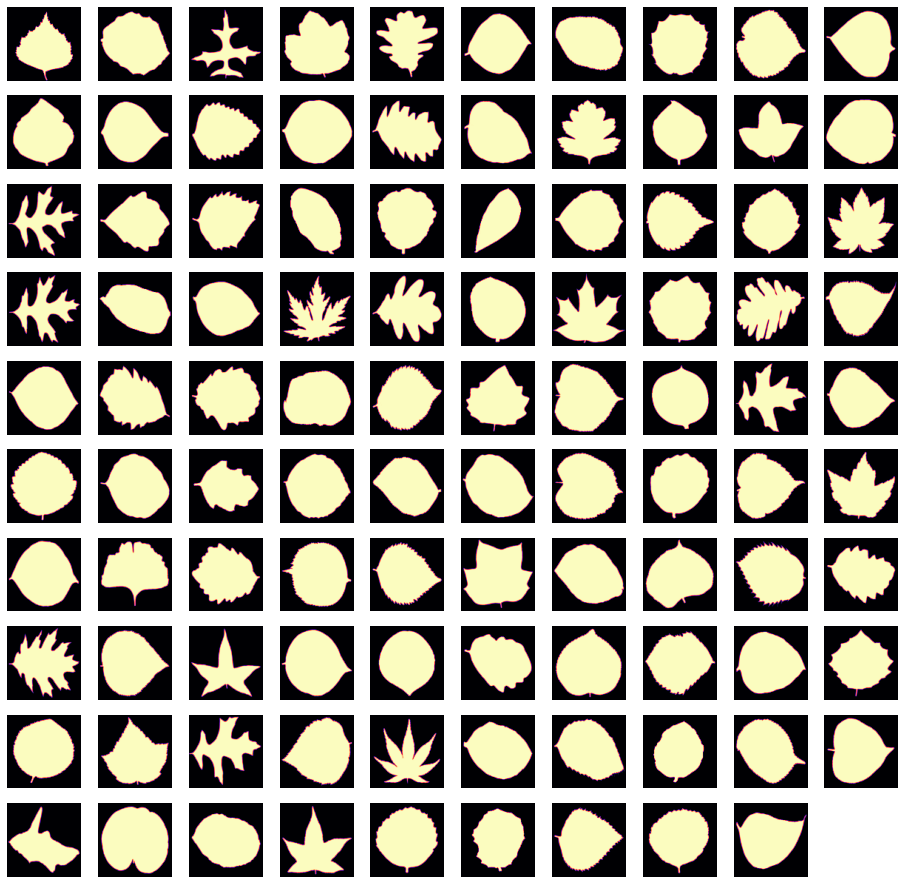

In [19]:
plt.figure(figsize=(16, 16))
for i in range(99):
    plt.subplot(10, 10, i + 1)
    plt.imshow(img_test2[i].reshape(100,100), cmap='magma')
    plt.axis('off')
    plt.grid(None)

Text(0.5, 1.0, 'Чтобы далеко не ходить, вот средний листок :)')

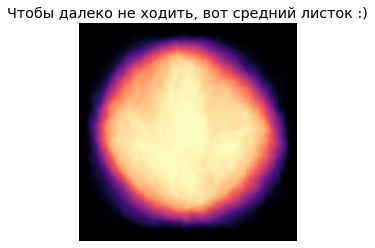

In [20]:
mean_leaf = img_test2.mean(axis=0)
plt.imshow(mean_leaf.reshape(100, 100), cmap='magma')
plt.axis('off')
plt.grid(None)
plt.title('Чтобы далеко не ходить, вот средний листок :)')

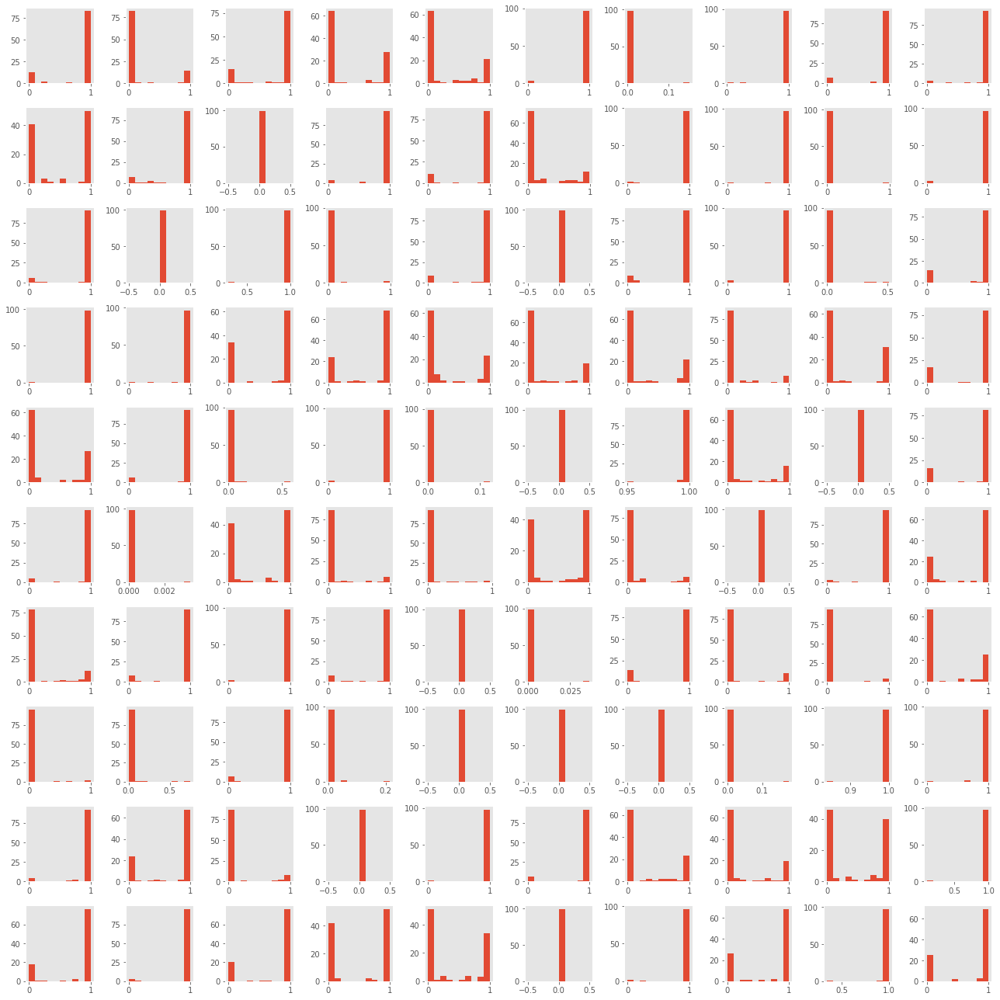

In [21]:
#Нарисуйте в табличке 10x10 100 гистограмм значений случайно выбранных пикселей (берем значние пикселя на всех картинках и составляем из них вектор, используйте векторизацию)
plt.figure(figsize=(18, 18))
for i in range(100):
    plt.subplot(10, 10, i + 1)
    k = np.random.randint(10000)
    pd.Series(img_test2[:, k]).hist()
    plt.grid(None)
plt.tight_layout()

Text(0.5, 0, '$\\sigma$')

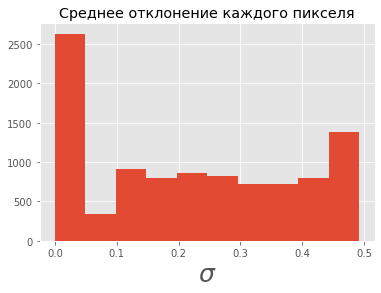

In [22]:
pd.Series(np.std(img_test2, axis=0)).hist()
plt.title('Среднее отклонение каждого пикселя')
plt.xlabel('$\sigma$', fontsize=25)

Ответьте на вопросы:
* Можно ли отличить листья разных классов визуально? Можете ли вы выделить группы похожих классов?
* Каковы минимальное/максимальное значения признаков? Какого множество значений признаков? Какие значения чаще всего принимают признаки? Похожи ли распределения разных признаков между собой?
* Можно ли бинаризовать изображения (чтобы каждый пиксель принимал значение 0 или 1) без сильной потери информации? Почему вы так думаете? По какому порогу лучше бинаризовать?
* Похож ли "средний лист" на обычный лист? Как вы думаете, почему? Много ли пикселей, которые всегда принимают одно и то же значение (константный признак)? 

1. До того как листья сжали в квадратик, визуально можно было бы выделить больше классов по длине/ширине - взять, например, листья ивы, которые с другими не спутаешь, а после решейпа лично я вижу класс круглых "оладушков", к которым относятся 80% листов, и игольчатые листья липа клёна или каннабиса, и волнистые - как дуб
2. Нуу если речь про картинки, то это числа в диапазоне от 0 до 1, и чаще всего они как раз и принимают значение 0 (края картинки), или 1 (её чаще круглый центр). Распределения очень похожи, и их можно разделить на три группы: 1)почти все 0 2)почти все 1 3)с вероятностью р - нули, с вероятностью 1-р единицы
3. В принципе можно, но я сомневаюсь что потом с этим справится случайный лес, так как мы увидим далее что ему очень важны контуры листа, где значения признаков и принимают величины где-то в промежутке от 0 до 1. Порог лучше всего 0.5, так это середина между 0 и 1 (уменьшим возможные потери) и вот k-means будет хорошо с этим справляться
4. На средний лист конечно больше всего повлияли те 80% листов, которые я бы назвала сейчас кругляшками, и да, я снова отвечу что очень много пикселей, которые принимают либо везде 0, либо везде 1 (можно бинаризовать), на среднем листе как раз и видно где расположены эти две области. Не похоже на лист, потому что палочки листьев слишком тонкие и расположены где попало, то же самое с концами листа, они просто растворились наложением 99 видов других листов. И слишком мало в выборке "необычных" листьев как у клёна, так что "лапки" таких листов не различимы на среднем листе

Теперь попробуем разобраться с внутренней структурой наших данных: применим к ним кластеризацию. Ограничимся самым простым методом - KMeans.

### Понижение размерности (1 балл за код + 1 балл за выводы)
* Выполните кластеризацию листьев с помощью KMeans на 9 кластеров. Метрика по умолчанию.
* Как вы знаете, у каждого кластера в KMeans есть центр - вектор той же размерности, что и объекты. Визуализируйте центры кластеров (переменная cluster\_centers\_ - то же самое, что centers в семинаре) в виде изображений 100x100, оформите их табицей 3x3.
* Повторите предыдущие действия для 25 и 100 кластеров.

In [23]:
from sklearn.cluster import KMeans

np.random.seed(6)
k_means = KMeans(n_clusters = 9)
k_means = k_means.fit(img_train)
clusters = k_means.predict(img_test)
unique, counts = np.unique(clusters, return_counts=True)
dict(zip(unique, counts)) # сколько объектов k_means отнесла к каждому кластеру по тестовой выборке

{0: 31, 1: 11, 2: 17, 3: 10, 4: 17, 5: 38, 6: 14, 7: 30, 8: 30}

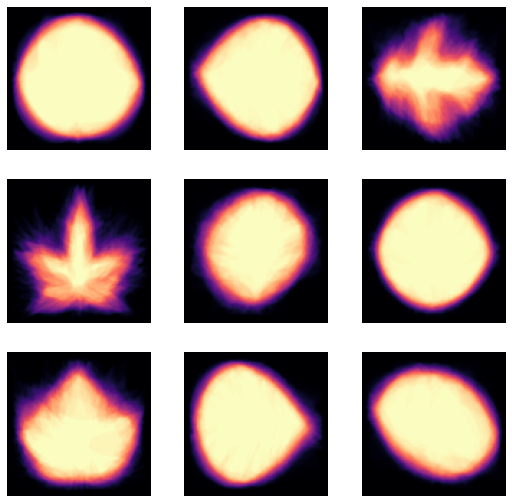

In [24]:
plt.figure(figsize=(9, 9))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(k_means.cluster_centers_[i].reshape(100,100), cmap='magma')
    plt.axis('off')

In [25]:
np.random.seed(6)
k_means = KMeans(n_clusters = 25)
k_means = k_means.fit(img_train)

clusters = k_means.predict(img_test)
unique, counts = np.unique(clusters, return_counts=True)
dict(zip(unique, counts)) # сколько объектов k_means отнесла к каждому кластеру по тестовой выборке

{0: 8,
 1: 7,
 2: 12,
 3: 2,
 4: 17,
 5: 8,
 6: 4,
 7: 15,
 8: 7,
 9: 11,
 10: 7,
 11: 5,
 12: 9,
 13: 2,
 14: 9,
 15: 7,
 16: 12,
 17: 10,
 18: 9,
 19: 8,
 20: 3,
 21: 9,
 22: 9,
 23: 2,
 24: 6}

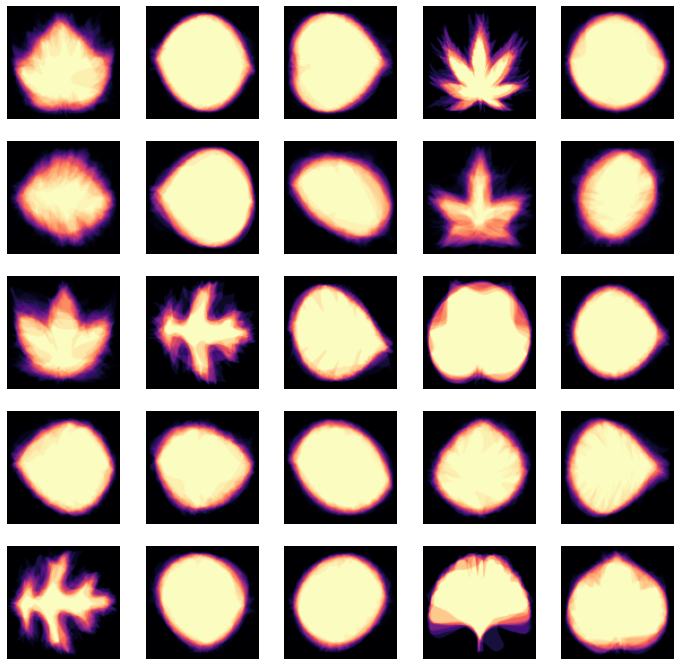

In [26]:
plt.figure(figsize=(12, 12))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(k_means.cluster_centers_[i].reshape(100,100), cmap='magma')
    plt.axis('off')

In [27]:
np.random.seed(6)
k_means = KMeans(n_clusters = 99)
k_means = k_means.fit(img_train)
clusters = k_means.predict(img_test)
unique, counts = np.unique(clusters, return_counts=True)
dict(zip(unique, counts)) # сколько объектов k_means отнесла к каждому кластеру по тестовой выборке

{2: 2,
 3: 6,
 4: 1,
 5: 1,
 6: 3,
 7: 4,
 8: 1,
 9: 2,
 10: 1,
 11: 3,
 12: 3,
 14: 3,
 15: 3,
 16: 2,
 17: 1,
 18: 2,
 19: 2,
 20: 1,
 21: 2,
 22: 7,
 23: 7,
 24: 1,
 25: 2,
 26: 2,
 27: 1,
 29: 2,
 30: 5,
 33: 4,
 35: 3,
 36: 4,
 37: 2,
 39: 9,
 40: 5,
 41: 5,
 43: 2,
 44: 2,
 45: 2,
 46: 2,
 48: 2,
 49: 7,
 50: 7,
 54: 1,
 55: 2,
 56: 2,
 57: 4,
 60: 1,
 62: 2,
 63: 2,
 64: 2,
 67: 1,
 68: 2,
 69: 3,
 70: 2,
 72: 3,
 74: 3,
 75: 2,
 76: 2,
 77: 1,
 79: 2,
 80: 3,
 81: 3,
 83: 2,
 84: 1,
 85: 5,
 88: 2,
 90: 9,
 91: 3,
 95: 5,
 96: 1,
 97: 1}

In [28]:
len(np.unique(clusters))

70

*что значит это число? это значит, что на тестовой выборке из 198 образцов он смог выделить только 70 кластеров, а не 99, то есть 29 потерял по дороге, что довольно много :()*

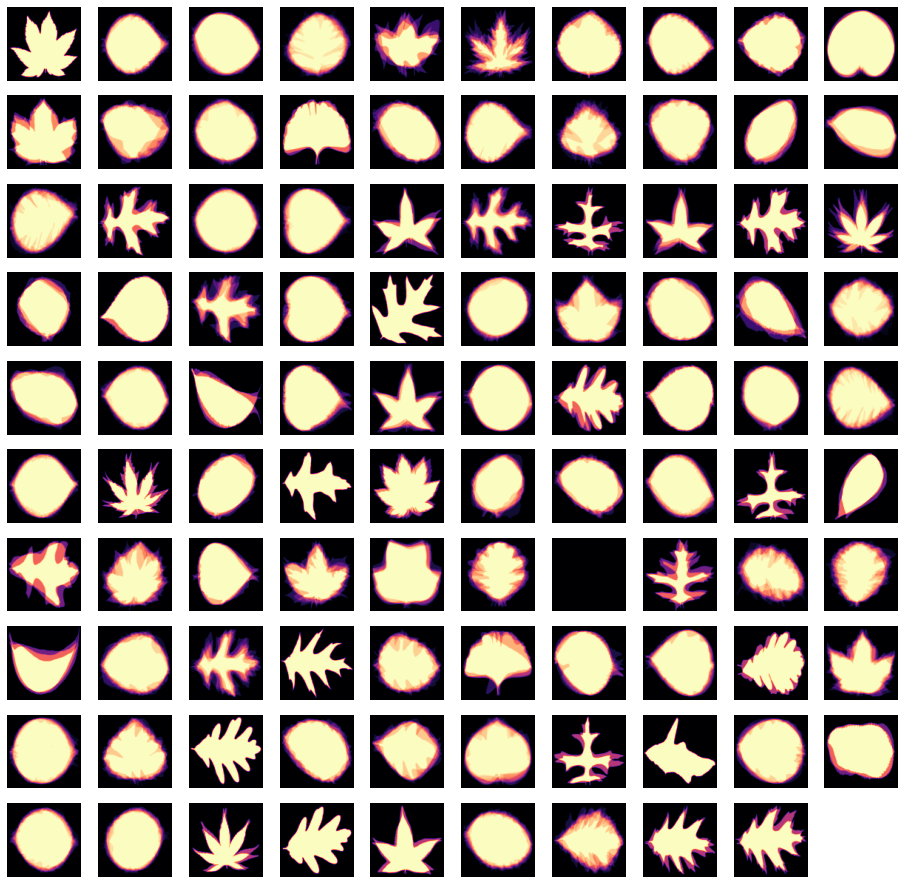

In [29]:
plt.figure(figsize=(16, 16))
for i in range(99):
    plt.subplot(10, 10, i + 1)
    plt.imshow(k_means.cluster_centers_[i].reshape(100,100), cmap='magma')
    plt.axis('off')

Ответьте на вопросы:
* Похожи ли центры кластеров на листья?
* В чем отличие от картинок листьев? В чем причина этого отличия?
* Есть ли среди кластеров похожие (или повторяющиеся)? 
* Какое, по вашему мнению, количество кластеров лучше всего подходит под эти данные? Почему?

### 1. Центры кластеров очень похожи на листья, что удивительно, это видно уже на количестве кластеров = 9
### 2. Отличие в том что сами листья одного вида всё же различаются между собой, и чтобы предоставить центр кластера, классификатору надо наложить несколько листов друг на друга, где-то это получается лучше, где-то хуже и лист становится "размытым"
### 3. Да! и их очень много! Я не ботаник и не смогу сказать чем отличаются друг от друга большинство этих листов, они ну просто одинаково выглядят
### 4. Как я написала выше, при разбиении на 99 кластеров (идеальный вариант), на тестовой выборке алгоритм угадал 70 из них, что уже много говорит о качестве. Нет, конечно существует идеальное разбиение на 99 видов растений, но из-за того что эти листья так похожы и один вид не отличить от другого, с этой задачей вряд ли когда-нибудь справится машина или человек. 25 кластеров тоже не нравится, так как там есть прямо один в один похожие друг на друга, значит что алгоритм имел какой-то один хороший кластер и разбил его на два. Наверное, 9 групп самое то, среди них все различные. И распределение тестовой выборки по этим 9-и кластерам похоже на правду: минимальное число в одном кластере равно 10, максимальное - 38, то есть нет "выбросов" и излишне тяжелых кластеров

Перейдем к решению задачи предсказания.

### 3 классификатора (1 балл за код + 1 балл за выводы)
Настройте 3 классификатора на изображениях и выполните их визуализацию.
* Начнем с примитивного метрического классификатора - [центроидного](http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestCentroid.html). Он использует идеи k-Means для решения задачи классификации: для каждого класса находит его центр (усреднением) - это обучение, а затем на этапе предсказания относит объект к тому классу, к центру которого он ближе. Настройте классификатор с гиперпараметрами по умолчанию на обучающей выборке. Выведите качество предсказания (accuracy) на контрольной выборке.
* Теперь по аналогии с KMeans визуализируйте центры классов - нарисуйте 99 изображений.
* Второй классификатор - наивный байесовский. Мы не рассматривали его в курсе, но про него можно почитать в [документации sklearn](http://scikit-learn.org/stable/modules/naive_bayes.html). Мы знаем, что наши признаки принимают целочисленные значения, поэтому для описания признаков подойдет мультиномиальное распределение. Настройте MultinomialNB для наших данных, выведите качество на контрольных данных.
* У MultinomialNB после обучения появляется атрибут feature\_log\_prob_ - это оцененный по данным логарифм вероятности каждого признака для каждого класса $P(x_i|y)$ (выведите форму атрибута, чтобы лучше понять, что имеется в виду). Визуализируйте эту матрицу в виде изображений 100x100 по аналогии с предыдущим классификатором.
* Третий классификатор - линейный. Настройте LogisticRegression и выведите качество на контрольной выборке.
* Отобразите веса для каждого класса в виде картинки 100x100.

**ЦЕНТРОИДНЫЙ КЛАССИФИКАТОР**

In [31]:
from sklearn.neighbors import NearestCentroid
from sklearn.metrics import accuracy_score

np.random.seed(6)
nc = NearestCentroid()
nc = nc.fit(img_train, y_train)
predictions = nc.predict(img_test)
nc.score(img_test, y_test)

0.5505050505050505

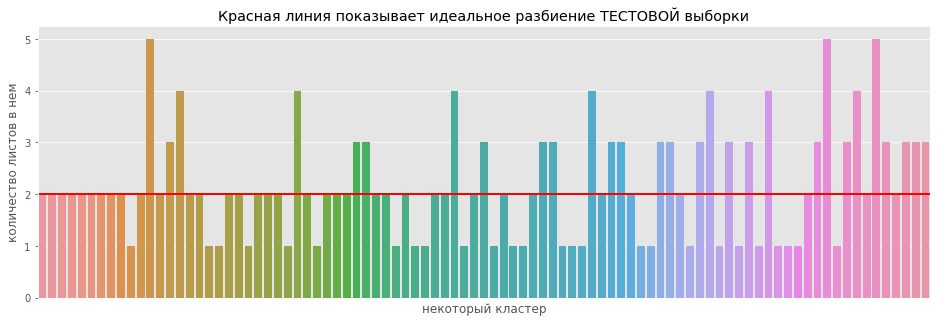

In [32]:
unique, counts = np.unique(predictions, return_counts=True)
nc_results = pd.DataFrame({'некоторый кластер':unique, 'количество листов в нем':counts})

fig, ax = plt.subplots(figsize=(16, 5))
sns.barplot(x='некоторый кластер', y='количество листов в нем', data=nc_results)
plt.axhline(2, color='r', linewidth=2)
plt.xticks([])
plt.title('Красная линия показывает идеальное разбиение ТЕСТОВОЙ выборки')
plt.show()

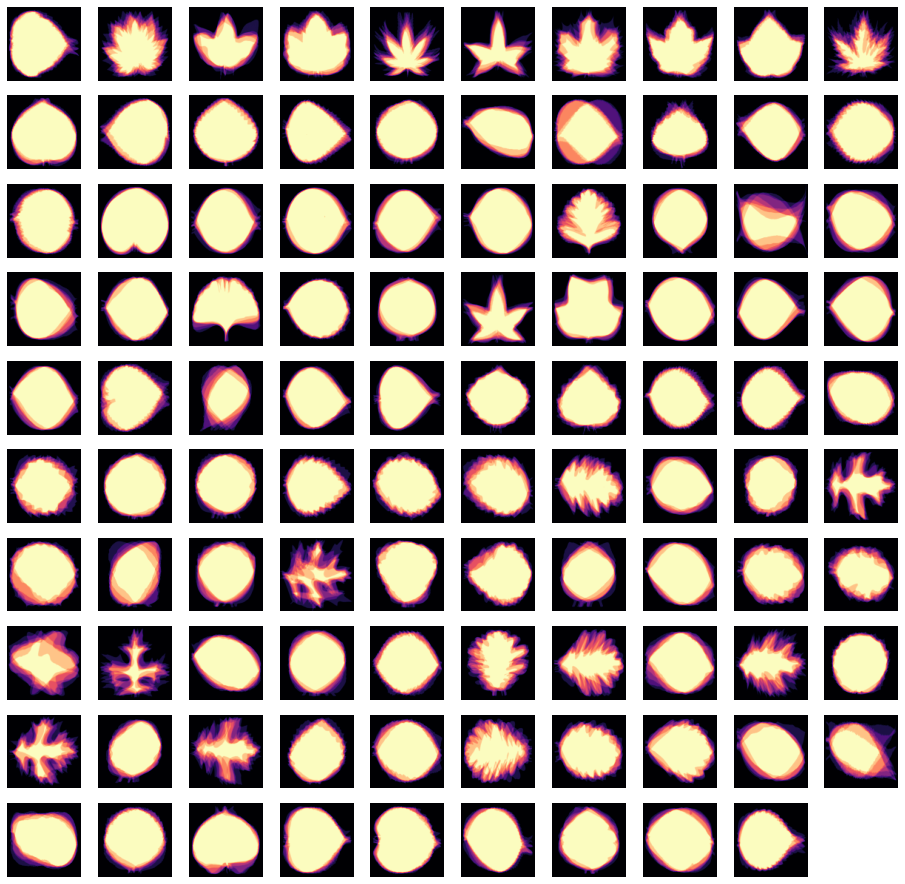

In [33]:
plt.figure(figsize=(16, 16))
for i in range(99):
    plt.subplot(10, 10, i + 1)
    plt.imshow(nc.centroids_[i].reshape(100,100), cmap='magma')
    plt.axis('off')

**НАИВНЫЙ БАЙЕСОВСКИЙ КЛАССИФИКАТОР**

In [34]:
from sklearn.naive_bayes import MultinomialNB

np.random.seed(6)
gnb = MultinomialNB()
gnb = gnb.fit(img_train, y_train)
predictions = gnb.predict(img_test)
gnb.score(img_test, y_test)

0.5151515151515151

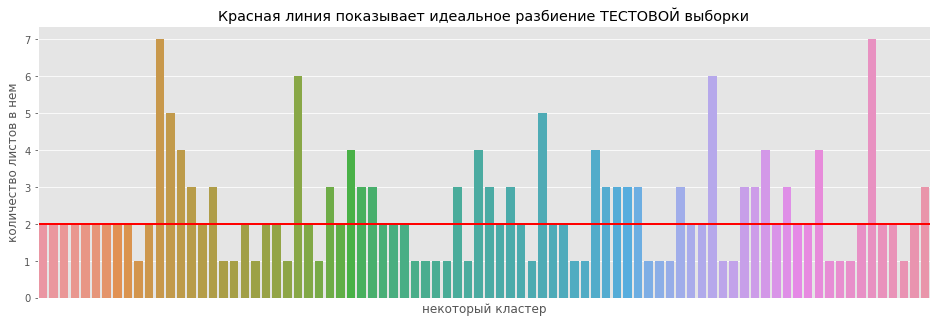

In [35]:
unique, counts = np.unique(predictions, return_counts=True)
nc_results = pd.DataFrame({'некоторый кластер':unique, 'количество листов в нем':counts})

fig, ax = plt.subplots(figsize=(16, 5))
sns.barplot(x='некоторый кластер', y='количество листов в нем', data=nc_results)
plt.axhline(2, color='r', linewidth=2)
plt.xticks([])
plt.title('Красная линия показывает идеальное разбиение ТЕСТОВОЙ выборки')
plt.show()

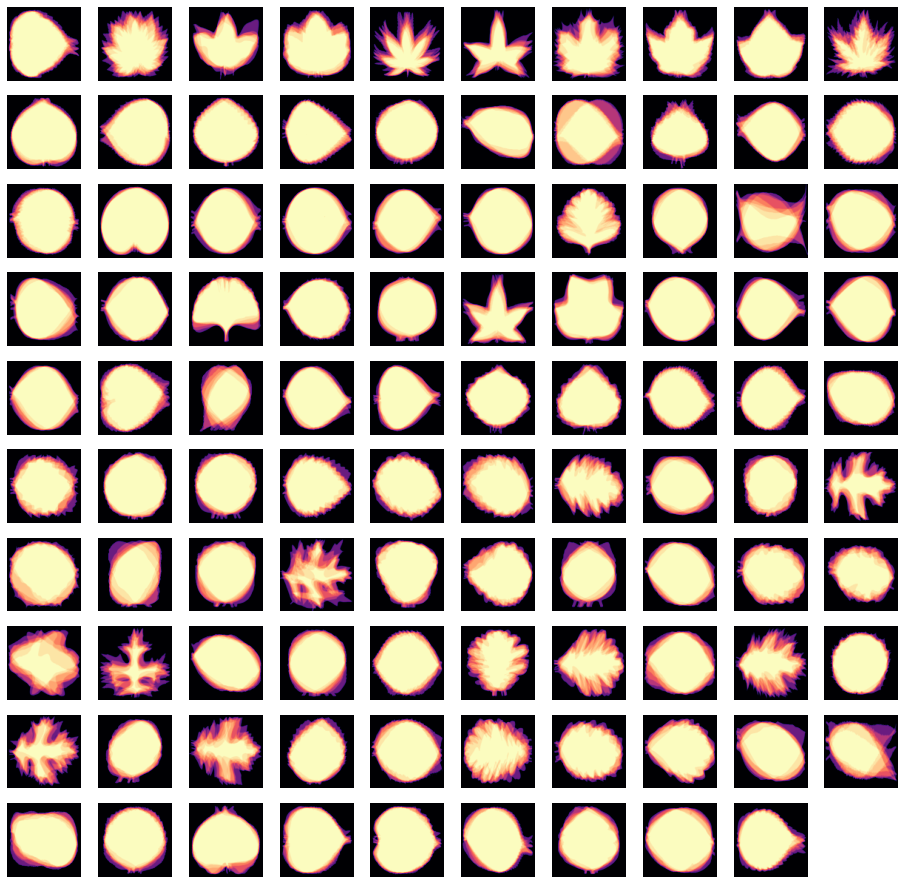

In [36]:
plt.figure(figsize=(16, 16))
for i in range(99):
    plt.subplot(10, 10, i + 1)
    plt.imshow(gnb.feature_log_prob_[i].reshape(100,100), cmap='magma')
    plt.axis('off')

**ЛОГИСТИЧЕСКАЯ РегРеССиЯ**

In [51]:
from sklearn.linear_model import LogisticRegression

np.random.seed(6)
classifier = LogisticRegression()
classifier.fit(img_train, y_train)
predictions = classifier.predict(img_test)
accuracy_score(predictions, y_test) # о ура нормальное качество

0.6262626262626263

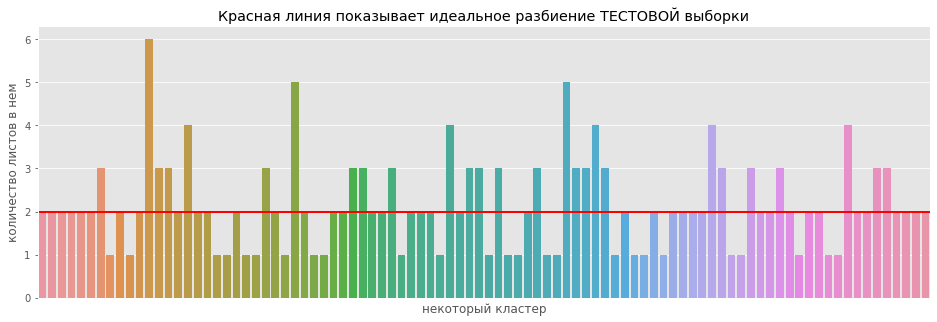

In [38]:
unique, counts = np.unique(predictions, return_counts=True)
nc_results = pd.DataFrame({'некоторый кластер':unique, 'количество листов в нем':counts})

fig, ax = plt.subplots(figsize=(16, 5))
sns.barplot(x='некоторый кластер', y='количество листов в нем', data=nc_results)
plt.axhline(2, color='r', linewidth=2)
plt.xticks([])
plt.title('Красная линия показывает идеальное разбиение ТЕСТОВОЙ выборки')
plt.show()

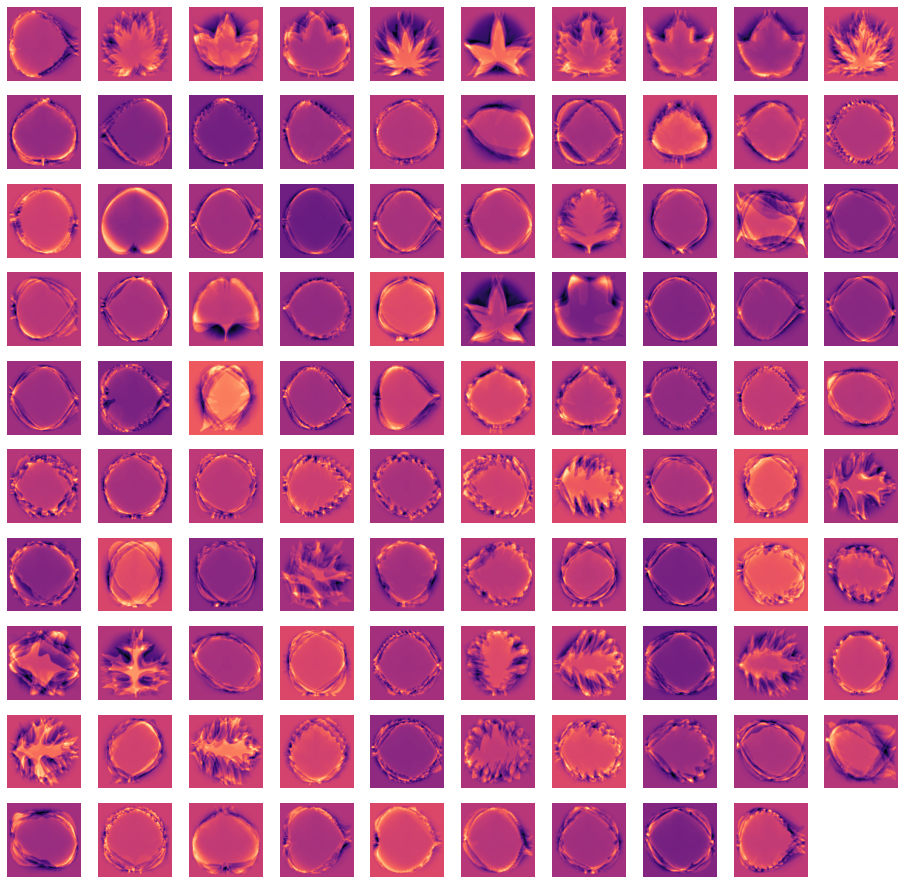

In [39]:
plt.figure(figsize=(16, 16))
for i in range(99):
    plt.subplot(10, 10, i + 1)
    plt.imshow(classifier.coef_[i].reshape(100,100), cmap='magma')
    plt.axis('off')

Ответьте на вопросы:
* Какой классификатор работает лучше? Предположите, почему.
* Похожи ли центры кластеров на исходные изображения листьев? А визуализированные вероятности? А веса?
* Как вы думаете, почему картинки весов линейного классификатора отличаются от остальных визуализаций?

### 1. Давайте предположу, что последний лучше всего, как минимум потому что у него выше качество на тестовой (63% против ~50%). 
### 2. Центры кластеров и вероятности похожи на начальные изображения, только несколько картинок как бы наложенны друг на друга, так как классификатор пытается найти что-то среднее для нескольких немного разных изображений. Веса совсем не похожи, сейчас объясню почему
### 3. Почему так сильно отличается логистическая регрессия: потому что она ищет "сильные" места картинок, например, резкий изгиб у основания листа, округлое окончание, много резко выделяющихся "лапок", и дает им больший вес. И судя по интенсивности цвета, веса всех признаков довольно похожи между собой, кроме тех особенностей что я назвала. Наверное, это лишнее, и если оставить только самые важные признаки (типа РСА) скорей всего качество улучшится

### Случайный лес (0.25 балла код + 0.25 балла выводы)
* Настройте случайный лес на изображениях. Выведите качество на контроле.
* Отобразите feature\_importances\_ в виде картинки 100x100.

In [87]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

np.random.seed(6)
rf = RandomForestClassifier(n_estimators=300, min_samples_split = 2, min_samples_leaf=1) #найденные на грид серче параметры
rf = rf.fit(img_train, y_train)
predictions = rf.predict(img_test)
rf.score(img_test, y_test)  #ну под пивко пойдет, хотя я ожидала лучше

0.6111111111111112

In [60]:
rf.feature_importances_.shape

(10000,)

(-0.5, 99.5, 99.5, -0.5)

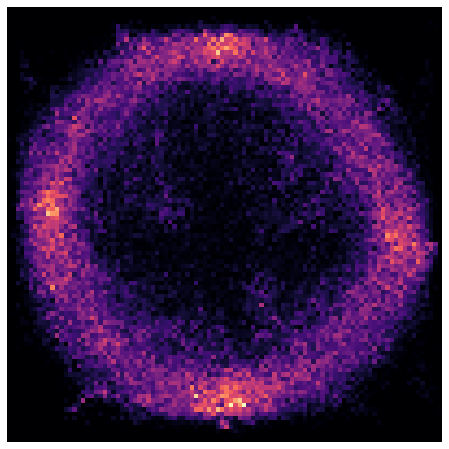

In [61]:
plt.figure(figsize=(8, 8))
plt.imshow(rf.feature_importances_.reshape(100,100), cmap='magma')
plt.axis('off')

Ответьте на вопросы:
* похожа ли картинка на изображение листа?
* соответствует ли картинка здравому смыслу? Можно ли сказать, что участки картинки, которые RF определил как неважные, действительно не помогают определить класс листа? Ответить на вопрос поможет сопоставление с изображением разброса каждого признака по выборке (см. раздел Простая визуализация, последний пункт).

### Нет не похожа, но смущаться этого не стоит, рандом форест увидел что у большей части пикселей разброс нулевой и собствено значение этих пикселей не влияет на итоговый результат (в центре всегда что-то белое, по краям всегда чёрный фон - эти значения вектора стабильны), поэтому самое главное это окраина листа и какое очертание принимают его контуры. Так что да, я бы сказала что картинка соответствует здравому смыслу, но я бы это назвала её как-нибудь по другому, а не лист :О

Попробовали методы - надо попробовать новые признаки.

### Понижение размерности + Случайный лес (0.5 балла код + 0.5 балла выводы)
Сейчас наши данные имеют высокую размерность признакового описания - 10000. А надо ли столько много? Не окажется ли, что реально вся информация может быть записана в гораздо меньшее количество признаков?
* Примените PCA к исходным данным и на новых признаках обучите случайный лес. Поэкспериментируйте с числом компонент. Запишите в отдельные массивы качество на обучении и качество на контроле. 
* На одной картинке постройте три графика: по оси x - число компонент, по оси y - качество; первый график - качество на обучении, второй - качество на контроле, третий - горизонтальная прямая (качество на контроле на исходных признаках).

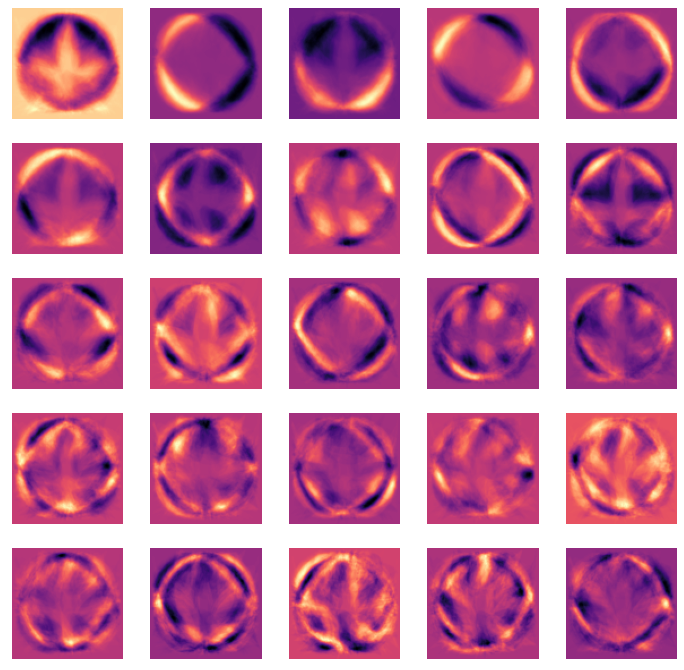

In [71]:
from sklearn.decomposition import PCA

np.random.seed(6)
pca = PCA()
pca = pca.fit(img_train)

plt.figure(figsize=(12, 12))
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.imshow(pca.components_[i, :].reshape(100, 100), cmap='magma')
    plt.xticks(())
    plt.yticks(())

### здесь мы вывели первые 25 компонент, выглядит интересно, особенно свечения по краям листа

In [90]:
img_test.shape

(198, 10000)

In [91]:
pca = PCA(69)
pca.fit_transform(img_test).shape #после поиска главных компонент

(198, 69)

In [155]:
np.random.seed(6)

quality_in_training = []
quality_in_testing = []
n_components = [5, 20, 40, 45, 50, 60, 100, 200, 300, 500]
for i in n_components:
    pca = PCA(i)
    rf = RandomForestClassifier(random_state = 69) # пока без параметров
    rf = rf.fit(pca.fit_transform(img_train), y_train)
    predictions = rf.predict(pca.transform(img_test))
    print(f'Качество на {i} компонентах: ', rf.score(pca.transform(img_test), y_test))
    quality_in_testing.append(rf.score(pca.transform(img_test), y_test))
    quality_in_training.append(rf.score(pca.transform(img_train), y_train))

# оптимально - 45 компонент

Качество на 5 компонентах:  0.40404040404040403
Качество на 20 компонентах:  0.5353535353535354
Качество на 40 компонентах:  0.6161616161616161
Качество на 45 компонентах:  0.5909090909090909
Качество на 50 компонентах:  0.601010101010101
Качество на 60 компонентах:  0.6060606060606061
Качество на 100 компонентах:  0.5858585858585859
Качество на 200 компонентах:  0.5151515151515151
Качество на 300 компонентах:  0.5252525252525253
Качество на 500 компонентах:  0.4494949494949495


In [151]:
gscv_rf = GridSearchCV(RandomForestClassifier(),
                       {'n_estimators': [100, 200, 500, 800]},
                       cv=3)
pca = PCA(45)
gscv_rf.fit(pca.fit_transform(img_train), y_train)
print(gscv_rf.best_score_)

0.5290404040404041


In [152]:
np.random.seed(6)

rf = RandomForestClassifier(random_state = 69, n_estimators=800)
rf = rf.fit(pca.fit_transform(img_train), y_train)
predictions = rf.predict(pca.transform(img_test))
rf.score(pca.transform(img_test), y_test) # качество немного лучше

0.6313131313131313

Text(0.5, 1.0, 'Идеальное разбиение на трейне, и не очень на тесте')

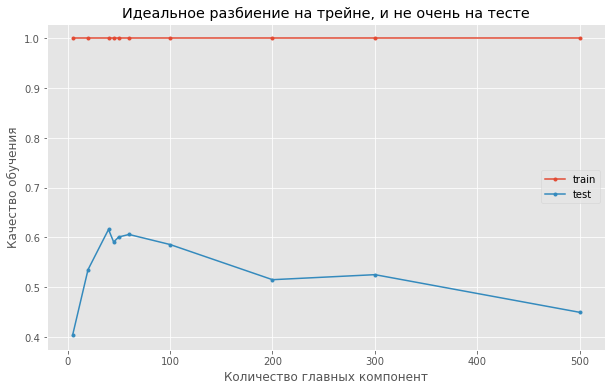

In [156]:
plt.figure(figsize=(10, 6))
plt.plot(n_components, quality_in_training, marker='.', label='train')
plt.plot(n_components, quality_in_testing, marker='.', label='test')
plt.xlabel('Количество главных компонент')
plt.ylabel('Качество обучения')
plt.legend()
plt.title('Идеальное разбиение на трейне, и не очень - на тесте')

Ответьте на вопросы:
* Можно ли сказать, что случайный лес переобучается?
* Можно ли указать число компонент, при котором достигается максимальное качество на контроле? Сильно ли это значение отличается от качество на всех признаках?

### 1. Про случайный лес - да, потому что качество на трейне очень сильно лучше чем качество на тесте (1>>0,6)
### 2. Если опустить рандом стейт, то лучшее качество постоянно гуляло от 30 до 60 компонент, поэтому я взяла золотую середину - 45.  Не сказала бы что качество улучшилось значительно, но скорость обучения точно уменьшилась, так как из 10000 признаков мы сделали  всего 45

### Обучение модели на табличных данных (0.25 балла код + 0.25 балла выводы)

В этом пункте мы возьмем табличные данные - те, которые открывали в самом начале. Это некие характеристики листьев, извлеченные из картинок. 

Обучите RandomForest на табличных данных, выведите качество на контроле, сравните его с качеством модели, обученной на исходных изображениях листьев. Сильно ли изменилось качество? Как вы думаете, почему?

In [154]:
np.random.seed(6)

gscv_rf = GridSearchCV(RandomForestClassifier(),
                       {'n_estimators': [100, 200, 500, 800, 1000], 'max_depth': [2, 3, 4, 5, None]},
                       cv=3)
gscv_rf.fit(X_train[:, 1:], y_train) # не забываем про столбцы с id
print(gscv_rf.best_params_)

{'max_depth': None, 'n_estimators': 1000}


In [157]:
np.random.seed(6)

rf = RandomForestClassifier(random_state = 69, n_estimators=1000)
rf = rf.fit(X_train[:, 1:], y_train)
predictions = rf.predict(X_test[:, 1:])
rf.score(X_test[:, 1:], y_test)

0.9797979797979798

## Вау, качество стало намного лучше, аж 97%
Что это значит? наверное, компьютер всё же плохо работает с картинками, намного лучше с готовыми табличными данными 
...
(ИЛИ ВСЁ ТАКИ ОЧЕНЬ БОЛЬШУЮ РОЛЬ ИГРАЛА ДЛИНА И ШИРИНА ЛИСТЬЕВ, которых мы лишились, сжав картинки до квадратов)

### Визуализация многомерных данных (1 бонусный балл)

Попробуйте визуализировать табличку из предыдущего задания с помощью UMAP, t-SNE, Isomap, MDS, пробуя разные значения гиперпараметров. Замерьте время, необходимое для построения визуализации каждым из способов. Сравните полученные картинки :) 

In [161]:
 import umap

 reducer = umap.UMAP()

AttributeError: module 'umap' has no attribute 'UMAP'

*тут он мне выдал ошибку module 'umap' has no attribute 'UMAP', что с этим делать я не знаю :()*

In [163]:
from MulticoreTSNE import MulticoreTSNE as TSNE

ModuleNotFoundError: No module named 'MulticoreTSNE'

*Этот пакет я просто не смогла загрузить и мне стало очень грустно :( Я правда пыталась нарисовать графики, но командная строка выдала слишком много красных букв, в которых я не смогла разобраться*